#### import libraries

In [1]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import joblib
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input, decode_predictions
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
import cv2
import warnings



warnings.filterwarnings("ignore")
K.clear_session()
tf.compat.v1.disable_eager_execution()

#### Keras functional model to get the output of intermediate layer In order to extract the feature maps we want to look at, we will create a Keras model that takes batches of images as input, and outputs the activations of all convolution and pooling layers.

#### To do this, we will use the Keras class Model. A Model is instantiated using two arguments: an input tensor (or list of input tensors), and an output tensor (or list of output tensors).

#### The resulting class is a Keras model, just like the Sequential models that you are familiar with, mapping the specified inputs to the specified outputs. What sets the Model class apart is that it allows for models with ___multiple outputs__, unlike Sequential.



### Load model

In [3]:
model = load_model(r"F:\computer vision files\cats vs dogs\cats_dogs_model.h5")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 3, 3, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 18432)             0         
                                                                 
 batch_normalization_94 (Bat  (None, 18432)            73728     
 chNormalization)                                                
                                                                 
 dense (Dense)               (None, 512)               9437696   
                                                                 
 dense_1 (Dense)             (None, 1)                 513       
                                                                 
Total params: 31,314,721
Trainable params: 9,475,073
Non-trainable params: 21,839,648
____________________________________

In [4]:
conv_model = model.layers[0]

In [5]:
layer_outputs = [layer.output for layer in conv_model.layers[1:len(conv_model.layers)]]
# Creates a model that will return these outputs, given the model input:
activation_model = Model(inputs=conv_model.input, outputs=layer_outputs)

#### When fed an image input, this model returns the values of the layer activations in the original model. 

#### This is the first time you encounter a multi-output model: until now the models you have seen only had exactly one input and one output. 

#### In the general case, a model could have any number of inputs and outputs. 
#### This one has one input and 8 outputs, one output per layer activation.

In [6]:
path = r"F:\computer vision files\cats vs dogs\training_set\cats\904.jpg"

def fit_img(image_path):
   
    img = image.load_img(image_path, target_size=(150, 150))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0
      
    return img

In [7]:
activations = activation_model.predict(fit_img(path))
activations

[array([[[[-0.6436563 ,  0.17641178, -0.1853412 , ..., -0.18514523,
            0.27210718,  0.03782447],
          [-0.63996917,  0.18459302, -0.1724418 , ..., -0.20302396,
            0.29053625,  0.03610726],
          [-0.62905794,  0.21235974, -0.15127613, ..., -0.24080676,
            0.29691175,  0.0414144 ],
          ...,
          [-0.6771792 ,  0.18447804, -0.20015016, ..., -0.2076992 ,
            0.23940407,  0.0918117 ],
          [-0.6109099 ,  0.14962584, -0.2431524 , ..., -0.1632796 ,
            0.21931948, -0.01795826],
          [-0.6546002 ,  0.13564706, -0.24229342, ..., -0.13323775,
            0.23462081,  0.04360802]],
 
         [[-0.62679046,  0.18394768, -0.18118921, ..., -0.20520061,
            0.2589449 ,  0.03503579],
          [-0.62363136,  0.18908364, -0.17172821, ..., -0.20655793,
            0.2753816 ,  0.03238786],
          [-0.6366181 ,  0.19840275, -0.17742698, ..., -0.22194092,
            0.28274286,  0.02254109],
          ...,
          [-0

In [8]:
len(activations)

310

#### For instance, this is the activation of the first convolution layer for our cat image input:


In [9]:
frist_layer = activations[3]
frist_layer.shape

(1, 72, 72, 32)

#### It's a 72x72 feature map with 32 channels. Let's try visualizing the 3rd channel:

In [10]:
px.imshow(frist_layer[0, :, :, 3], color_continuous_scale="viridis")

#### This channel appears to encode a diagonal edge detector. 
#### Let's try the 3th channel -- but note that your own channels may vary, 
#### since the specific filters learned by convolution layers are not deterministic

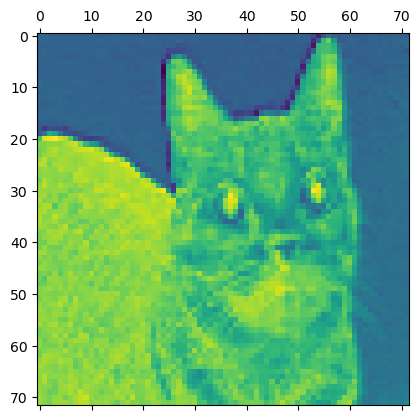

In [11]:
plt.matshow(frist_layer[0, :, :, 3], cmap="viridis")

In [12]:
px.imshow(frist_layer[0, :, :, 20], color_continuous_scale="viridis")

#### This one looks like a "bright green dot" detector, 
#### useful to encode cat eyes. At this point, 
#### let's go and plot a complete visualization of all the activations in the network.
#### We'll extract and plot every channel in each of our 8 activation maps, 
#### and we will stack the results in one big image tensor, 
#### with channels stacked side by side.

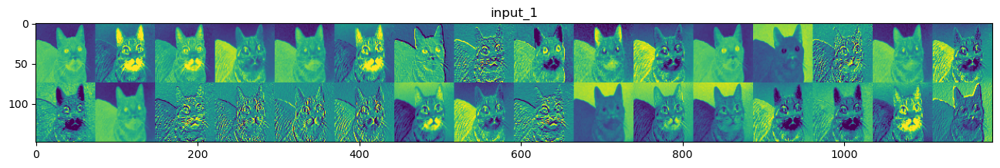

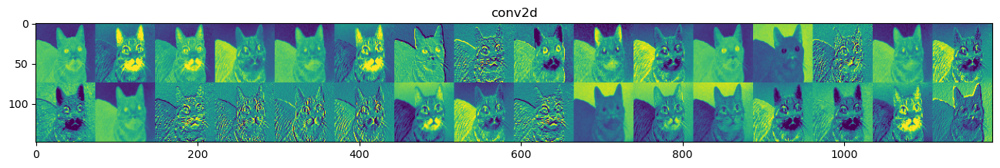

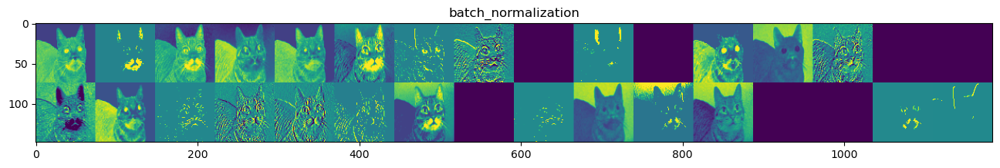

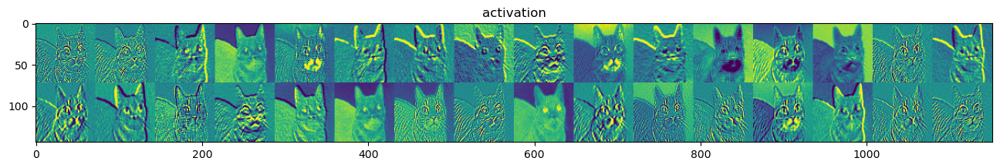

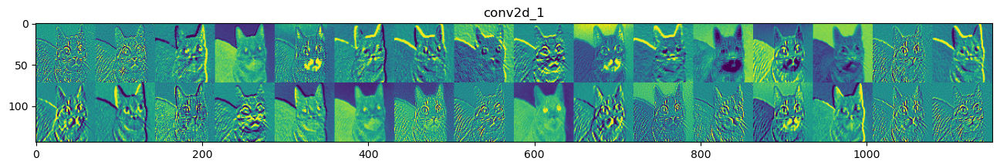

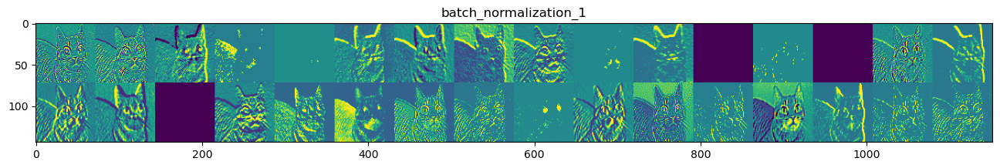

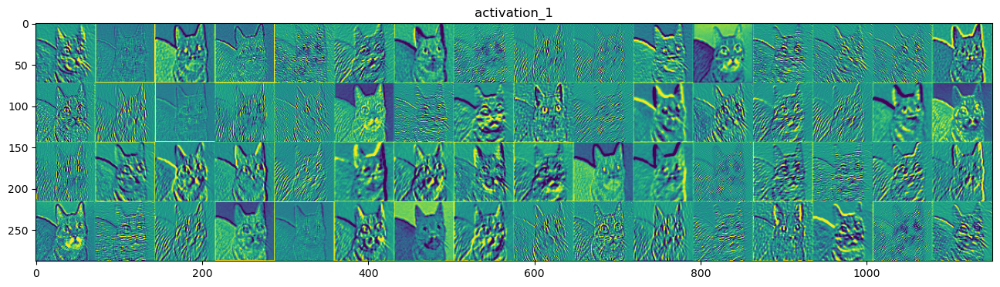

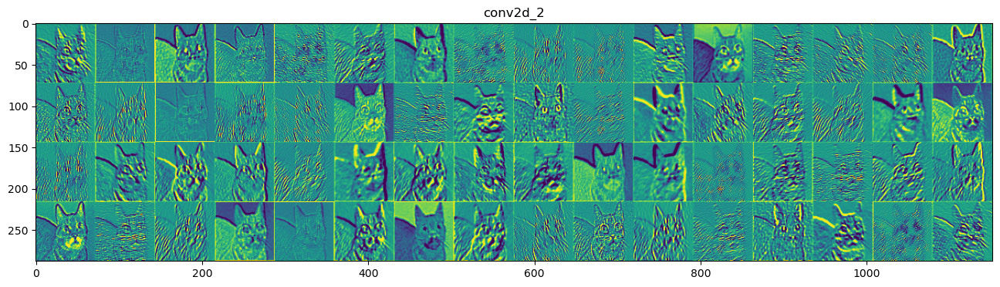

In [13]:
layer_names = []
for layer in activation_model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

### Visualizing heatmaps of class activation


#### We will introduce one more visualization technique, one that is useful for understanding which parts of a given image led a convnet to its final classification decision. This is helpful for "debugging" the decision process of a convnet, in particular in case of a classification mistake. It also allows you to locate specific objects in an image.

#### This general category of techniques is called "Class Activation Map" (CAM) visualization, and consists in producing heatmaps of "class activation" over input images. A "class activation" heatmap is a 2D grid of scores associated with an specific output class, computed for every location in any input image, indicating how important each location is with respect to the class considered. For instance, given a image fed into one of our "cat vs. dog" convnet, Class Activation Map visualization allows us to generate a heatmap for the class "cat", indicating how cat-like different parts of the image are, and likewise for the class "dog", indicating how dog-like differents parts of the image are

###  Grad-CAM
The specific implementation we will use is the one described in Grad-CAM: Why did you say that? Visual Explanations from Deep Networks via Gradient-based Localization.

It is very simple: it consists in taking the output feature map of a convolution layer given an input image, and weighing every channel in that feature map by the gradient of the class with respect to the channel.

Intuitively, one way to understand this trick is that we are weighting a spatial map of "how intensely the input image activates different channels" by "how important each channel is with regard to the class", resulting in a spatial map of "how intensely the input image activates the class".

In [14]:
incep_model = InceptionV3(weights='imagenet')

In [15]:
incep_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

#### Let's consider the following image of Cat, 
#### possible a mother and its cub, 
#### strolling in the savanna (under a Creative Commons license):



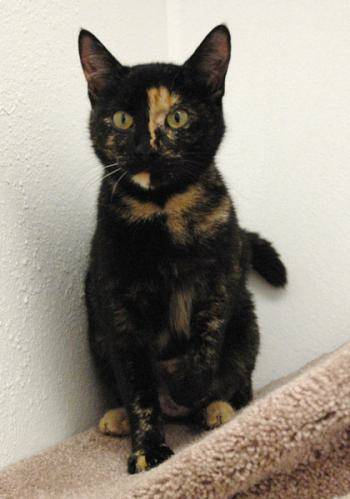

In [16]:
# The local path to our target image
img_path = r"F:\computer vision files\cats vs dogs\test_set\cats\cat.4644.jpg"

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(299, 299, 3))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

#### You can now run the pretrained network on the image and decode its prediction vector back to a human-readable format:



In [17]:
preds = incep_model.predict(x)
print('the probability of Predicted is : \n', decode_predictions(preds, top=3)[0])

the probability of Predicted is : 
 [('n02124075', 'Egyptian_cat', 0.74609876), ('n02123045', 'tabby', 0.14916568), ('n02123159', 'tiger_cat', 0.009972947)]


#### To visualize which parts of our image were the most Cat"
-like, let's set up the Grad-CAM process:

In [18]:
np.argmax(preds[0])

285

#### The conv2d_259 output is batch_sizexx8x8x320 = 1x8x8x320

#### Now, we can merge the block5_conv3 outputs (batch_sizex8x8x320),
#### by weighting and sum over the 320 dimension with the grads to get one heatmap 1x8x8.


In [19]:
incep_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

In [20]:
# This is the "cat" entry in the prediction vector
cat = incep_model.output[:, 283]

# The is the output feature map of the `conv2d_71` layer,
# the last convolutional layer in InceptionV3
last_conv_layer = incep_model.get_layer('conv2d_71')

# This is the gradient of the "cat" class with regard to
# the output feature map of `conv2d_71 `
grads = K.gradients(cat, last_conv_layer.output)[0]

# This is a vector of shape (320,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `conv2d_71`,
# given a sample image
iterate = K.function([incep_model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of cat
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the cat class
for i in range(320):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

In [21]:
heatmap.shape

(8, 8)

For visualization purpose, we will also normalize the heatmap between 0 and 1:


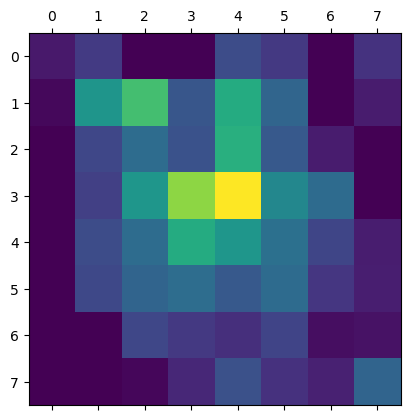

In [22]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

Finally, we will use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained.

The resulting heatmap is 8x8, with each block has a receptive field over the input 224x224 image.

You can think of it as a drop of ink spilled over to cover bigger area.

So each block of the 8x8 corresponds to an area of size = 224/8x224/8 in the input image.

In [23]:
# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite(r'F:\computer vision files\cats vs dogs\cam.jpg', superimposed_img)

True

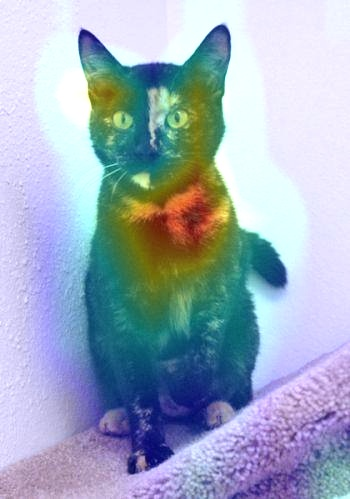

#### This visualisation technique answers two important questions:

#####  - Why did the network think this image contained an cat?
##### - Where is the cat located in the picture?


#### In particular, it is interesting to note that the ears of cat cub are strongly activated: this is probably how the network can tell the difference between cats type(Egyptian_cat, tiger_cat, )